# CALSNIC registered cortical-surface PCA

This notebook inspects a PCA model fitted to the full bilateral CALSNIC pial surfaces after sex-volume normalization and rigid registration. The model is fitted on 80% of the subjects and evaluated on an untouched 20% held-out test set. The model and diagnostics are stored on `/mnt/bulk10tb` so this notebook remains small and reproducible.

Each mesh has shared FreeSurfer fs6 topology, so every PCA coordinate represents the same cortical vertex across subjects. The model contains only 202 healthy-control subjects. With 162 training subjects, the largest possible PCA rank is `162 - 1 = 161`; 256D and 512D requests are transparently shown as effective 161D reconstructions. Coordinates were eTIV-volume-normalized before PCA, so errors are reported in normalized coordinate units, not directly in millimetres.

In [15]:
from pathlib import Path
import json

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from plyfile import PlyData
import plotly.graph_objects as go
from plotly.subplots import make_subplots

RESULT_DIR = Path('/mnt/bulk10tb/CALSNIC/registered_cortical_pca_test80_20_v2')
assert RESULT_DIR.exists(), (
    f'Missing PCA output at {RESULT_DIR}. Run scripts/analyze_calsnic_registered_cortical_pca.py first.'
)

metadata = json.loads((RESULT_DIR / 'metadata.json').read_text())
metric_rename = {
    'mean_vertex_rmse_mm': 'mean_vertex_rmse_normalized_units',
    'median_vertex_rmse_mm': 'median_vertex_rmse_normalized_units',
    'p95_vertex_rmse_mm': 'p95_vertex_rmse_normalized_units',
    'max_vertex_rmse_mm': 'max_vertex_rmse_normalized_units',
}
summary = pd.read_csv(RESULT_DIR / 'reconstruction_error_summary.csv').rename(columns=metric_rename)
curve = pd.read_csv(RESULT_DIR / 'reconstruction_error_curve.csv').rename(columns=metric_rename)
metadata


{'source_dir': '/home/jakaria/CALSNIC/calsnic_pial_surface/mesh_dataset/pial_surface_volume_normalized_for_sex_rigid_reg',
 'mesh_variant': 'pial_surface_volume_normalized_for_sex_rigid_reg',
 'n_meshes': 202,
 'n_training_meshes': 162,
 'n_test_meshes': 40,
 'n_vertices': 81924,
 'n_faces': 163840,
 'n_features': 245772,
 'pca_rank': 161,
 'requested_components': [128, 256, 512],
 'effective_components': {'128': 128, '256': 161, '512': 161},
 'input_classes': {'controls': 202, 'als': 0, 'unclassified': 0},
 'split': {'evaluation': 'held-out test',
  'test_fraction': 0.2,
  'seed': 42,
  'training_subject_ids': ['CALSNIC1_CAL_C001',
   'CALSNIC1_CAL_C002',
   'CALSNIC1_CAL_C003',
   'CALSNIC1_CAL_C004',
   'CALSNIC1_CAL_C005',
   'CALSNIC1_CAL_C006',
   'CALSNIC1_CAL_C007',
   'CALSNIC1_CAL_C008',
   'CALSNIC1_CAL_C009',
   'CALSNIC1_CAL_C010',
   'CALSNIC1_EDM_C001',
   'CALSNIC1_EDM_C002',
   'CALSNIC1_EDM_C004',
   'CALSNIC1_EDM_C006',
   'CALSNIC1_EDM_C009',
   'CALSNIC1_EDM_C010',

## Data inventory and reconstruction summary

Errors below are held-out test reconstruction errors. PCA is fitted only on 162 subjects, then the remaining 40 unseen subjects are projected into that training-only PCA basis and reconstructed from truncated scores. The mesh coordinates are eTIV-volume-normalized; they should not be interpreted as direct millimetres.

In [16]:
print(f"Available meshes: {metadata['n_meshes']} healthy controls")
print(f"PCA training meshes: {metadata['n_training_meshes']}; held-out test meshes: {metadata['n_test_meshes']}")
print(f"Topology: {metadata['n_vertices']:,} vertices, {metadata['n_faces']:,} faces per mesh")
print(f"PCA rank: {metadata['pca_rank']} (the sample-size limit is N - 1)")
print('Requested -> effective component counts:', metadata['effective_components'])
display_summary = summary.copy()
display_summary['explained_variance_ratio'] = display_summary['explained_variance_ratio'].map('{:.2%}'.format)
for column in ('mean_vertex_rmse_normalized_units', 'median_vertex_rmse_normalized_units', 'p95_vertex_rmse_normalized_units', 'max_vertex_rmse_normalized_units'):
    display_summary[column] = display_summary[column].map('{:.4f}'.format)
display_summary


Available meshes: 202 healthy controls
PCA training meshes: 162; held-out test meshes: 40
Topology: 81,924 vertices, 163,840 faces per mesh
PCA rank: 161 (the sample-size limit is N - 1)
Requested -> effective component counts: {'128': 128, '256': 161, '512': 161}


,requested_components,effective_components,explained_variance_ratio,mean_vertex_rmse_normalized_units,median_vertex_rmse_normalized_units,p95_vertex_rmse_normalized_units,max_vertex_rmse_normalized_units
0,128,128,94.20%,0.0389,0.0400,0.0432,0.0596
1,256,161,100.00%,0.0382,0.0394,0.0422,0.0587
2,512,161,100.00%,0.0382,0.0394,0.0422,0.0587


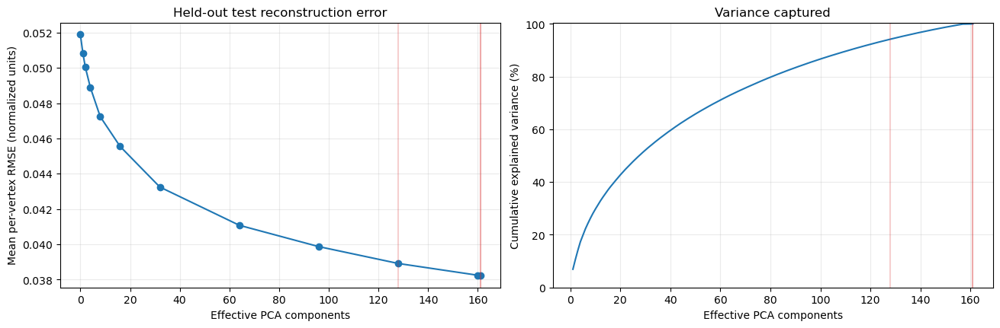

In [17]:
variance = np.load(RESULT_DIR / 'explained_variance.npy')
cumulative_variance = np.cumsum(variance) / variance.sum()

fig, axes = plt.subplots(1, 2, figsize=(13, 4.2), layout='constrained')
axes[0].plot(curve['effective_components'], curve['mean_vertex_rmse_normalized_units'], marker='o')
axes[0].set(xlabel='Effective PCA components', ylabel='Mean per-vertex RMSE (normalized units)',
            title='Held-out test reconstruction error')
axes[0].grid(alpha=0.25)
axes[1].plot(np.arange(1, len(cumulative_variance) + 1), 100 * cumulative_variance)
axes[1].set(xlabel='Effective PCA components', ylabel='Cumulative explained variance (%)',
            title='Variance captured')
axes[1].set_ylim(0, 100.5)
axes[1].grid(alpha=0.25)
for ax in axes:
    for row in summary.itertuples(index=False):
        ax.axvline(row.effective_components, color='tab:red', alpha=0.22)
plt.show()


## Original vs. PCA reconstructions

The displayed subject is selected to have near-median 128D held-out test reconstruction error. The visualizations use the complete triangular mesh (all 163,840 faces), so the cortical surface should render as a continuous mesh rather than a point cloud. Every comparison panel uses the same fixed coordinate ranges and lighting, preventing per-panel autoscaling from exaggerating geometric differences.

In [18]:
def read_vertices(path):
    vertex = PlyData.read(str(path))['vertex'].data
    return np.column_stack((vertex['x'], vertex['y'], vertex['z'])).astype(np.float32)

FACE_STRIDE = 1  # Keep every face: a dense, continuous cortical mesh.

def make_view_mesh(vertices, faces):
    selected_faces = faces[::FACE_STRIDE]
    used, inverse = np.unique(selected_faces.reshape(-1), return_inverse=True)
    return vertices[used], inverse.reshape(-1, 3), used

mean_vertices = np.load(RESULT_DIR / 'mean_vertices.npy')
components = np.load(RESULT_DIR / 'components.npy', mmap_mode='r')
score_file = metadata['arrays'].get('test_scores') or 'scores.npy'
scores = np.load(RESULT_DIR / score_file, mmap_mode='r')
faces = np.load(RESULT_DIR / 'faces.npy')
rank = metadata['pca_rank']
subject_index = metadata['representative_subject']['index']
subject_id = metadata['representative_subject']['id']
original = read_vertices(Path(metadata['representative_subject']['source_ply']))

def reconstruct(requested_components):
    effective = min(requested_components, rank)
    return mean_vertices + np.tensordot(
        scores[subject_index, :effective], components[:effective], axes=(0, 0)
    )

reconstructions = {k: reconstruct(k) for k in (128, 256, 512)}
subject_rmse_native = {
    k: float(np.sqrt(np.mean(np.sum((original - reconstructed) ** 2, axis=1))))
    for k, reconstructed in reconstructions.items()
}
normalization_report = pd.read_csv('/home/jakaria/CALSNIC/ply_volume_normalization_report.csv')
normalization_row = normalization_report.loc[
    normalization_report['set_name'].eq('whole') & normalization_report['subject_id'].eq(subject_id)
]
assert len(normalization_row) == 1, f'Missing normalization scale for {subject_id}'
normalization_scale = float(normalization_row.iloc[0]['scale_initial'])
subject_rmse_original_mm_equivalent = {
    k: value / normalization_scale for k, value in subject_rmse_native.items()
}
bbox_diagonal = float(np.linalg.norm(original.ptp(axis=0)))
subject_rmse_relative_percent = {
    k: 100 * value / bbox_diagonal for k, value in subject_rmse_native.items()
}
print(f'Representative subject: {subject_id}')
print(f'Normalization scale: {normalization_scale:.6f}; normalized mesh diagonal: {bbox_diagonal:.4f}')
for k in (128, 256, 512):
    print(f'{k}D (effective {min(k, rank)}D): {subject_rmse_native[k]:.4f} normalized units; '
          f'≈{subject_rmse_original_mm_equivalent[k]:.2f} original-coordinate mm-equivalent; '
          f'{subject_rmse_relative_percent[k]:.2f}% of mesh diagonal')


Representative subject: CALSNIC2_MON_C004
Normalization scale: 0.008869; normalized mesh diagonal: 2.0680
128D (effective 128D): 0.0399 normalized units; ≈4.50 original-coordinate mm-equivalent; 1.93% of mesh diagonal
256D (effective 161D): 0.0393 normalized units; ≈4.43 original-coordinate mm-equivalent; 1.90% of mesh diagonal
512D (effective 161D): 0.0393 normalized units; ≈4.43 original-coordinate mm-equivalent; 1.90% of mesh diagonal


In [19]:
def add_surface(fig, vertices, faces, column, title, color):
    view_vertices, view_faces, _ = make_view_mesh(vertices, faces)
    fig.add_trace(
        go.Mesh3d(
            x=view_vertices[:, 0], y=view_vertices[:, 1], z=view_vertices[:, 2],
            i=view_faces[:, 0], j=view_faces[:, 1], k=view_faces[:, 2],
            color=color, flatshading=False, lighting=dict(ambient=0.55, diffuse=0.8),
            hoverinfo='skip', name=title, showscale=False,
        ),
        row=1, col=column,
    )

titles = [
    'Original',
    f"128D<br>{subject_rmse_native[128]:.4f} normalized; ≈{subject_rmse_original_mm_equivalent[128]:.2f} mm",
    f"256D → {min(256, rank)}D<br>{subject_rmse_native[256]:.4f} normalized; ≈{subject_rmse_original_mm_equivalent[256]:.2f} mm",
    f"512D → {min(512, rank)}D<br>{subject_rmse_native[512]:.4f} normalized; ≈{subject_rmse_original_mm_equivalent[512]:.2f} mm",
]
fig = make_subplots(
    rows=1, cols=4, specs=[[{'type': 'scene'}] * 4], subplot_titles=titles,
    horizontal_spacing=0.01,
)
surface_color = '#77aadd'  # Same material in every panel for direct comparison.
add_surface(fig, original, faces, 1, 'Original', surface_color)
add_surface(fig, reconstructions[128], faces, 2, '128D', surface_color)
add_surface(fig, reconstructions[256], faces, 3, '256D', surface_color)
add_surface(fig, reconstructions[512], faces, 4, '512D', surface_color)
comparison_vertices = np.concatenate([original, *reconstructions.values()], axis=0)
scene_min = comparison_vertices.min(axis=0)
scene_max = comparison_vertices.max(axis=0)
scene_padding = 0.03 * (scene_max - scene_min)
scene_ranges = [(scene_min[d] - scene_padding[d], scene_max[d] + scene_padding[d]) for d in range(3)]
camera = dict(eye=dict(x=1.55, y=1.55, z=0.85))
shared_scene = dict(
    aspectmode='data', camera=camera,
    xaxis=dict(range=scene_ranges[0], visible=False),
    yaxis=dict(range=scene_ranges[1], visible=False),
    zaxis=dict(range=scene_ranges[2], visible=False),
)
for scene_name in ('scene', 'scene2', 'scene3', 'scene4'):
    fig.update_layout(**{scene_name: shared_scene})
fig.update_layout(
    title=f'Original and PCA-reconstructed held-out cortical surfaces: {subject_id}',
    height=500, width=1500, margin=dict(l=0, r=0, b=0, t=55), showlegend=False,
)
fig.show()


In [20]:
# Spatial error map for the 128D reconstruction.
vertex_error = np.linalg.norm(original - reconstructions[128], axis=1)
view_vertices, view_faces, used_vertices = make_view_mesh(original, faces)
error_fig = go.Figure(
    go.Mesh3d(
        x=view_vertices[:, 0], y=view_vertices[:, 1], z=view_vertices[:, 2],
        i=view_faces[:, 0], j=view_faces[:, 1], k=view_faces[:, 2],
        intensity=vertex_error[used_vertices], intensitymode='vertex',
        colorscale='Turbo', colorbar=dict(title='Error (normalized units)'),
        flatshading=True, hoverinfo='skip',
    )
)
error_fig.update_layout(
    title=f'128D per-vertex reconstruction error (normalized units): {subject_id}', height=650,
    scene=shared_scene,
)
error_fig.show()


## Interpretation

- The 128D reconstruction is a real compression of the 161-dimensional PCA space learned from training subjects only.
- 256D and 512D are identical here because the 162-subject training set caps PCA at 161 directions.
- All reported errors and the displayed reconstruction use a held-out test subject that was not used to fit PCA.
- The error is in eTIV-volume-normalized coordinate units. For the displayed subject, the notebook also shows an approximate original-coordinate millimetre equivalent by reversing that subject's known isotropic normalization scale.
- The visible 128D mismatch is real: it is about 1.9% of the displayed mesh's bounding-box diagonal. The common axis ranges prevent the viewer from adding further visual exaggeration.